In [1]:
import time

import numpy as np
import cv2
import matplotlib.pyplot as plt
from cv2 import aruco

In [2]:
%matplotlib notebook

# Image Capture

In [248]:
frame = cv2.imread('arucas.png')
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

<IPython.core.display.Javascript object>


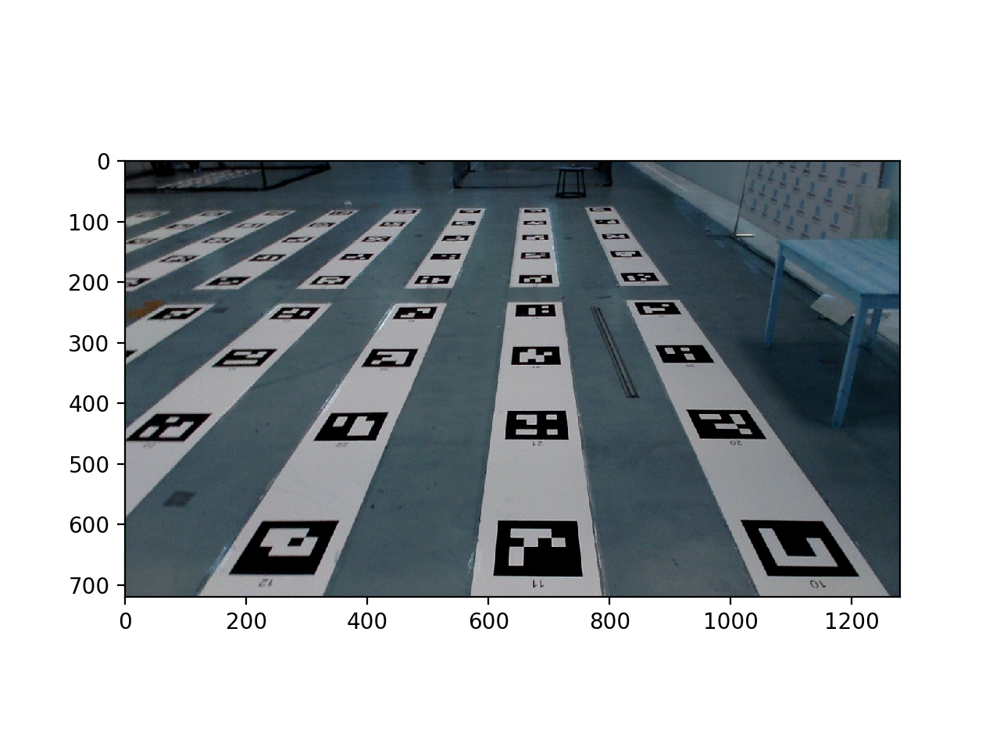

In [140]:
plt.figure()
plt.imshow(frame)
plt.show()

# Aruco Detection

In [201]:
# Constraints
aruco_dict = aruco.Dictionary_get(aruco.DICT_4X4_250)
parameters =  aruco.DetectorParameters_create()

# Calibration dummy data
camera_matrix = np.array([[ 8.8156838357588504e+02, 0., 6.6407222707602079e+02],
                          [0.,  9.1293632091054508e+02, 3.1605711055015257e+02],
                          [0., 0., 1. ]])

dist_coef = np.array([[ -1.9247068886167515e-01, 5.1756312172367869e+00,
       -2.8691338670582937e-02, -3.723353565729084e-02,
       -2.36244085545787874e+01 ]])#0.]])

dist_coef = np.float64([[0., 0., 0., 0., 0.]])

# Axis that we'll draw
axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)

## Calibrate camera

In [194]:
w = 1280
h = 720

In [195]:
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(camera_matrix, dist_coef, (w, h), 1, (w, h))

In [196]:
dst = cv2.undistort(frame, camera_matrix, dist_coef, None, newcameramtx)

In [197]:
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

<IPython.core.display.Javascript object>


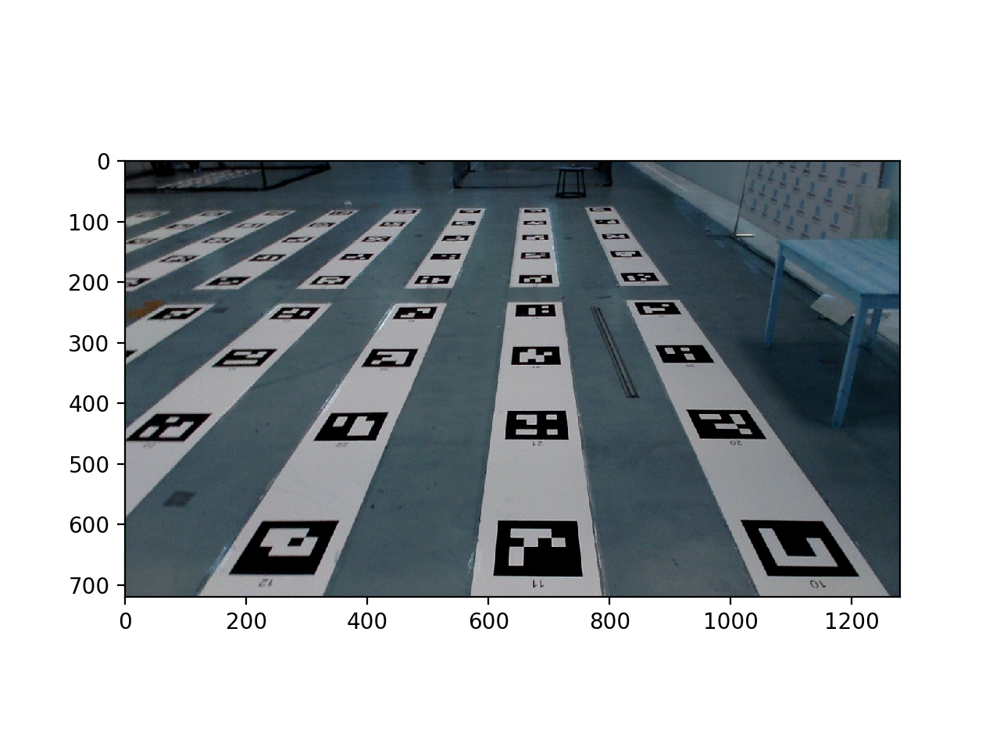

In [198]:
plt.figure()
plt.imshow(dst)
plt.show()

In [164]:
roi

(314, 220, 714, 197)

In [203]:
corners, ids, rejectedImgPoints = aruco.detectMarkers(gray, aruco_dict, parameters=parameters)

In [204]:
frame_markers = aruco.drawDetectedMarkers(frame.copy(), corners, ids)

# Aruco Pose estimation

In [205]:
# rvec - rotation vector
# tvec - translation vector
rvec, tvec, _ = aruco.estimatePoseSingleMarkers(corners, 0.33, camera_matrix, dist_coef)

<IPython.core.display.Javascript object>


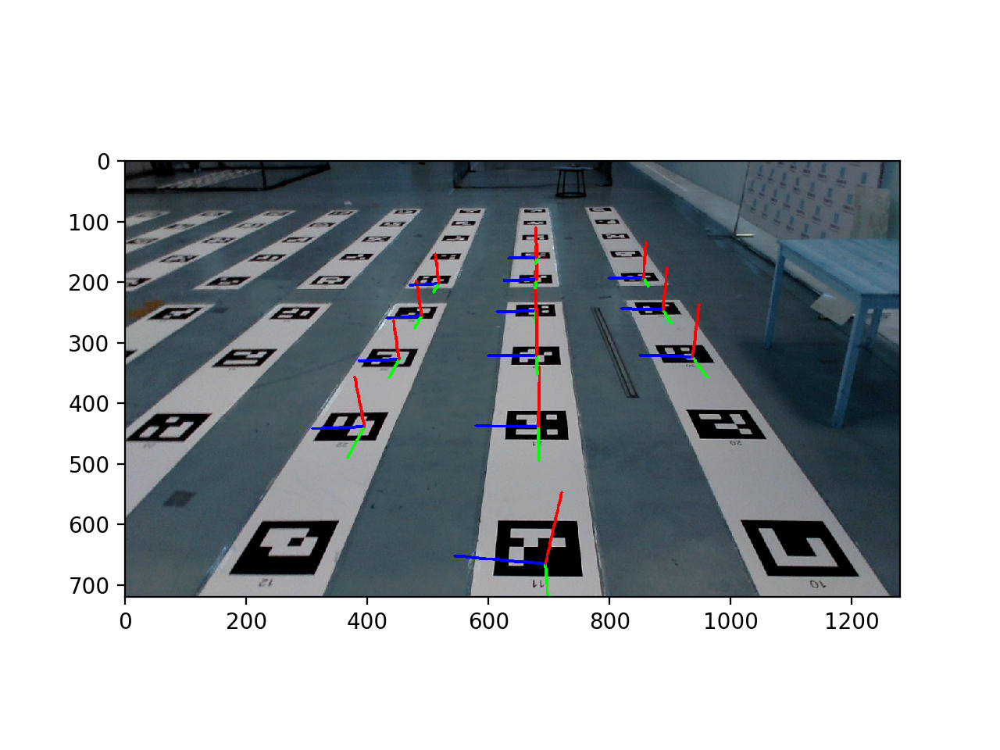

In [200]:
aruc3d = frame.copy()
for rvecs, tvecs in zip(rvec, tvec):
    aruco.drawAxis(aruc3d, camera_matrix, dist_coef, rvecs, tvecs, 0.33)
plt.figure()
plt.imshow(aruc3d)
plt.show()

# Show position of markers, top-down

In [73]:
tvec.shape

(13, 1, 3)

<IPython.core.display.Javascript object>


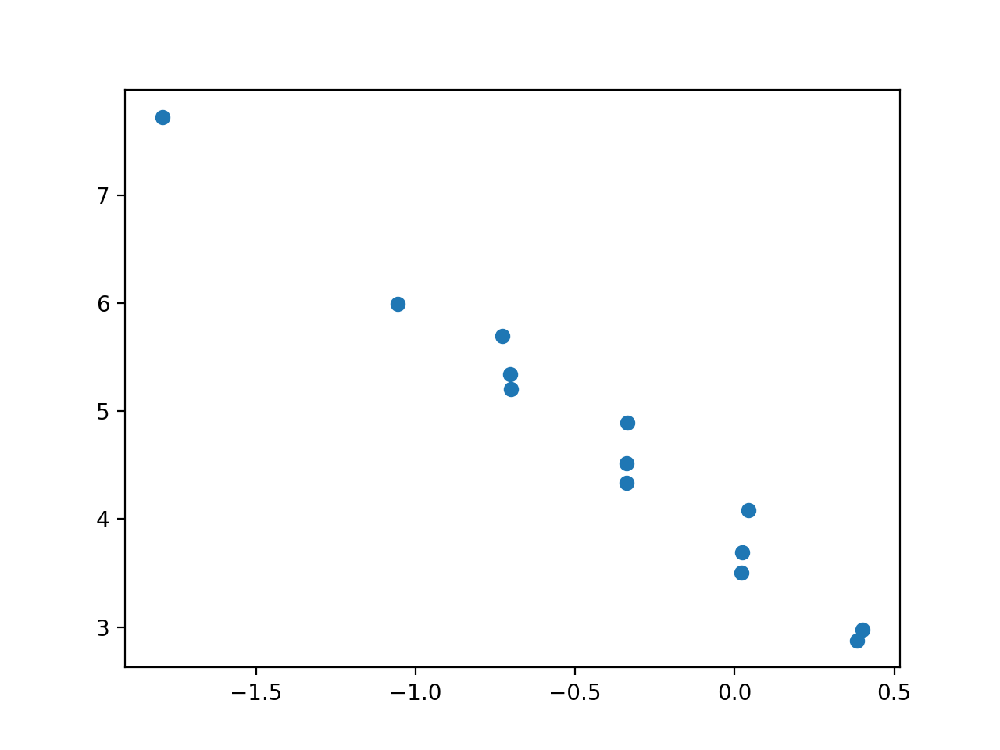

In [243]:
plt.figure()
plt.scatter(tvec[:, :, 1], tvec[:, :, 2])
plt.show()

## let's find angles for the camera
We will need pitch and roll, assuming that markers are on the ground

In [ ]:
pitch = tvec[:, :, 1], tvec[:, :, 2]

In [244]:
# ok, though we can find them, we don't need to solve this problem

# Real Time Aruco Pose Estimation

In [46]:
import time

<IPython.core.display.Javascript object>


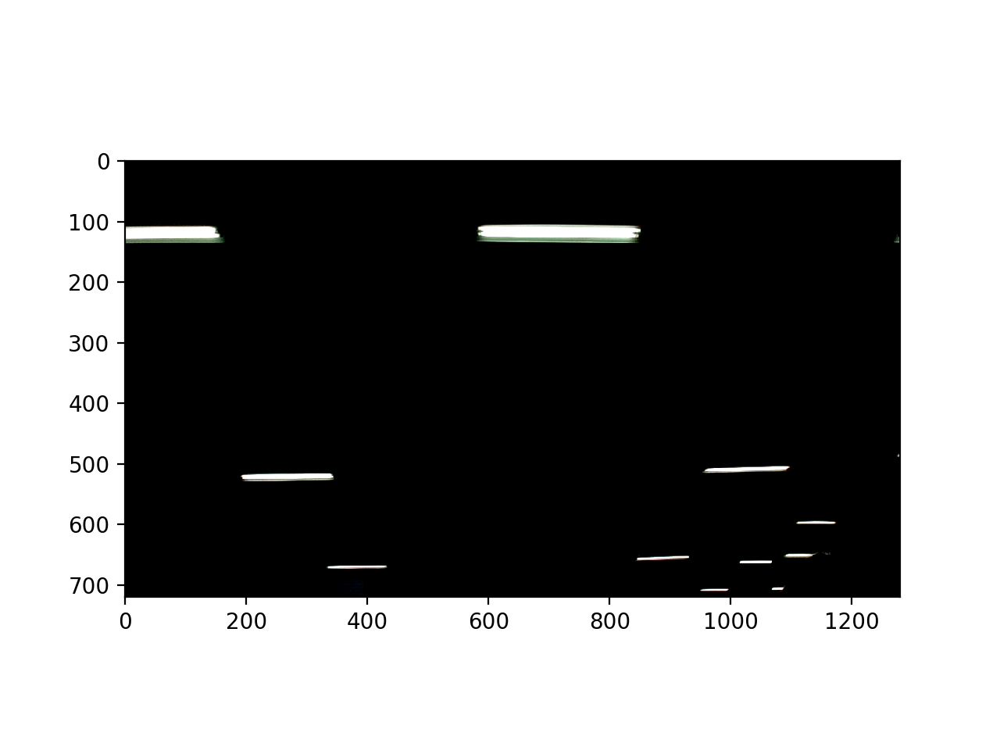

<IPython.core.display.Javascript object>


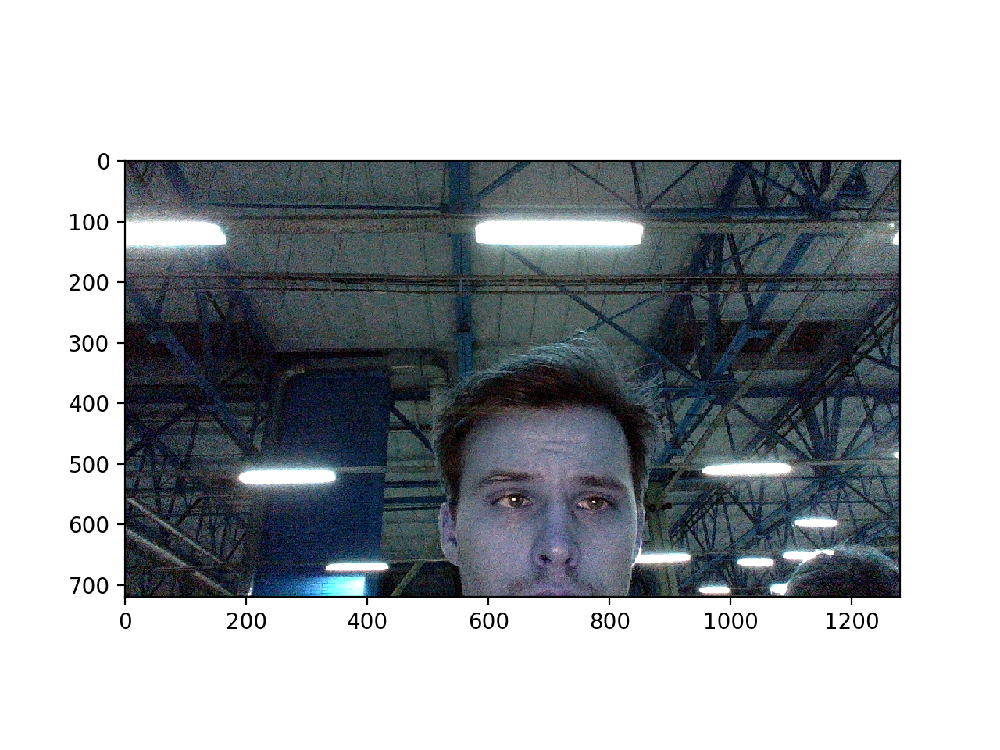

<IPython.core.display.Javascript object>


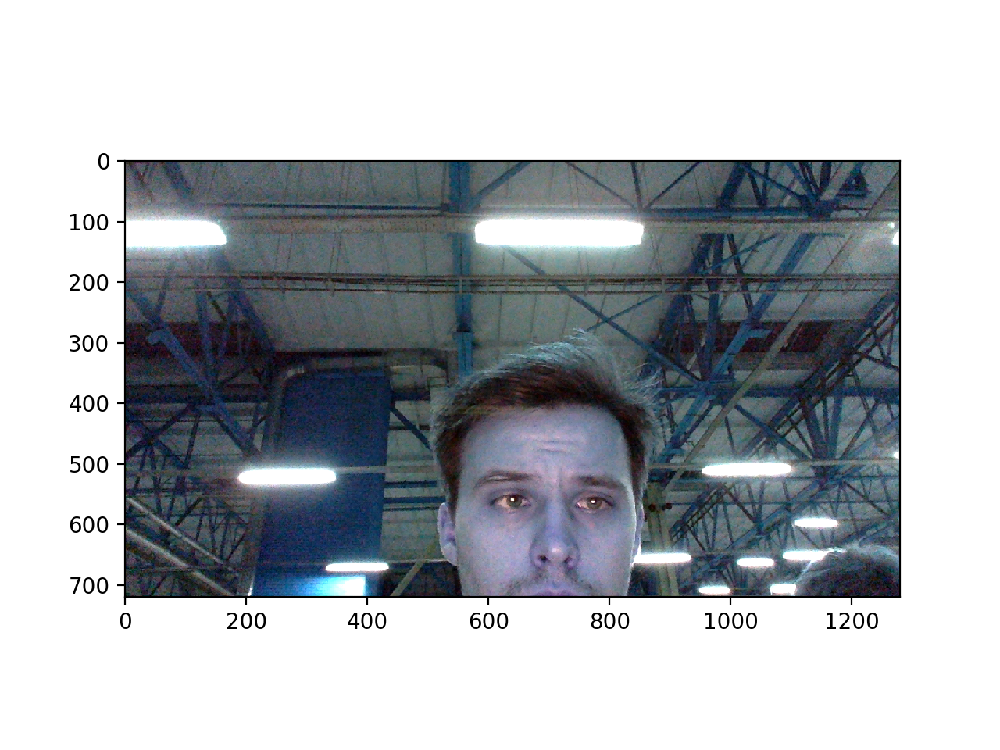

<IPython.core.display.Javascript object>


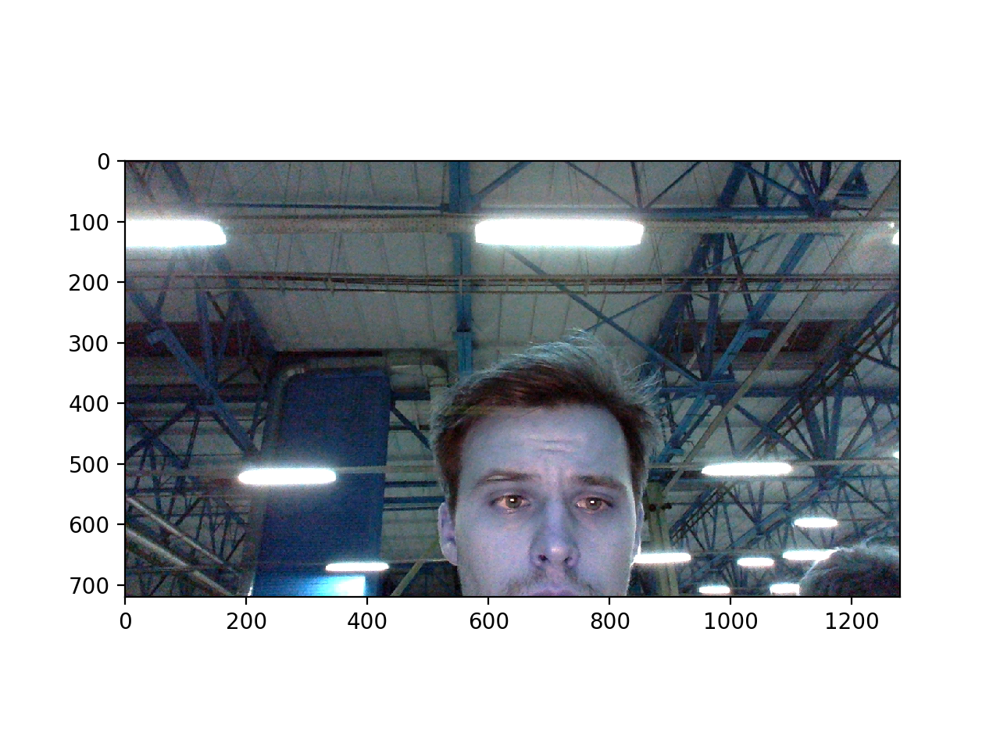

<IPython.core.display.Javascript object>


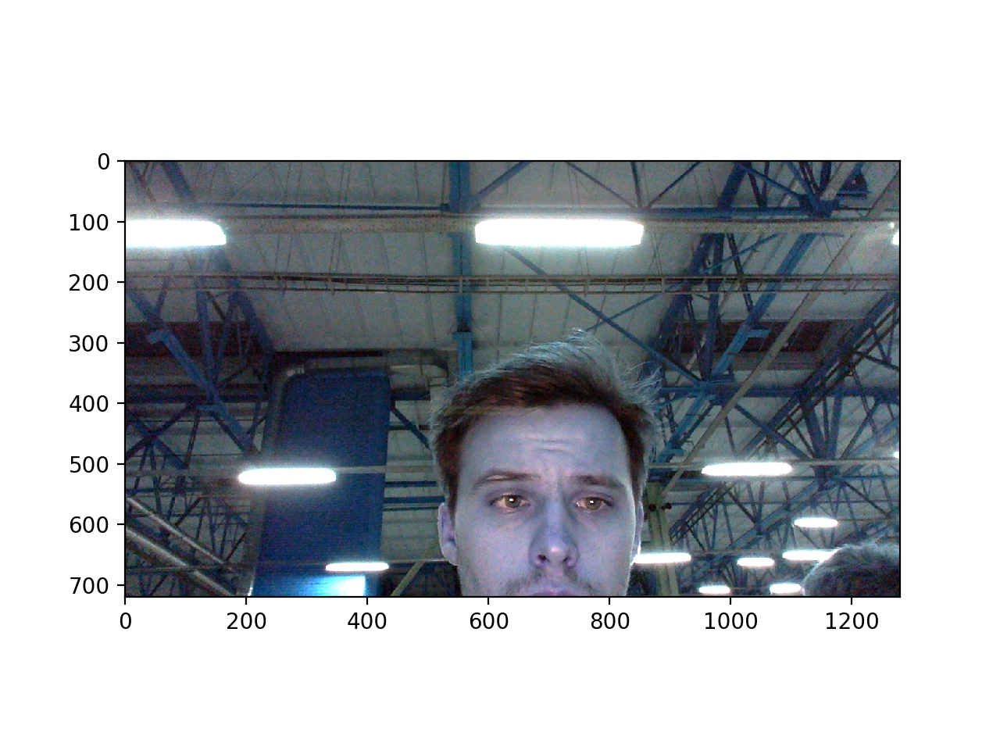

<IPython.core.display.Javascript object>


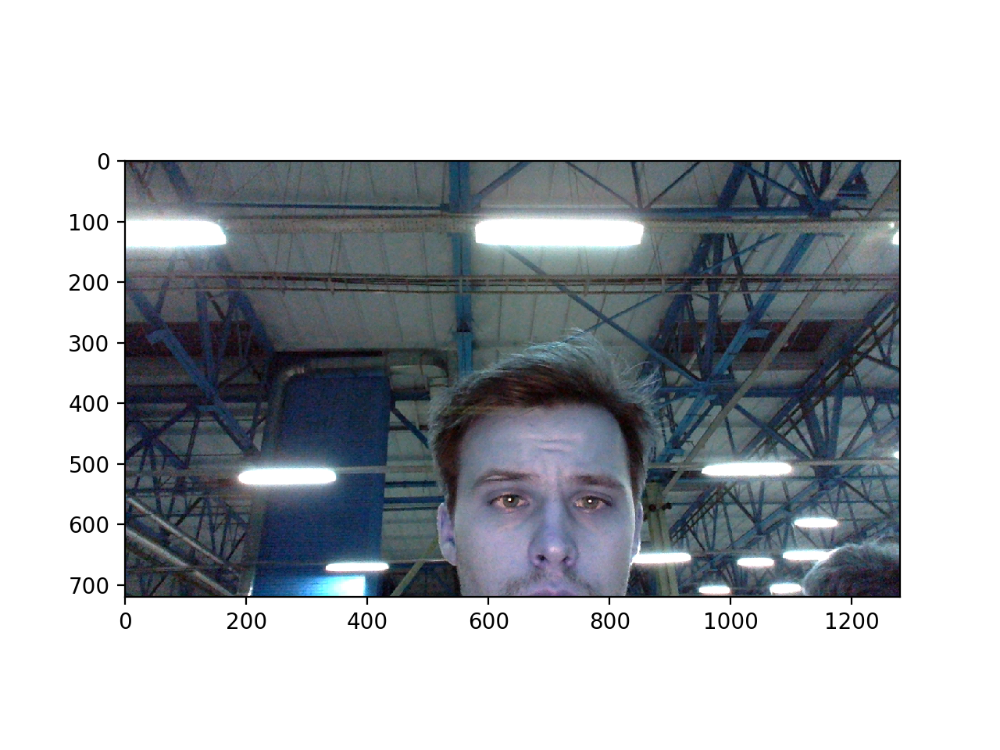

<IPython.core.display.Javascript object>


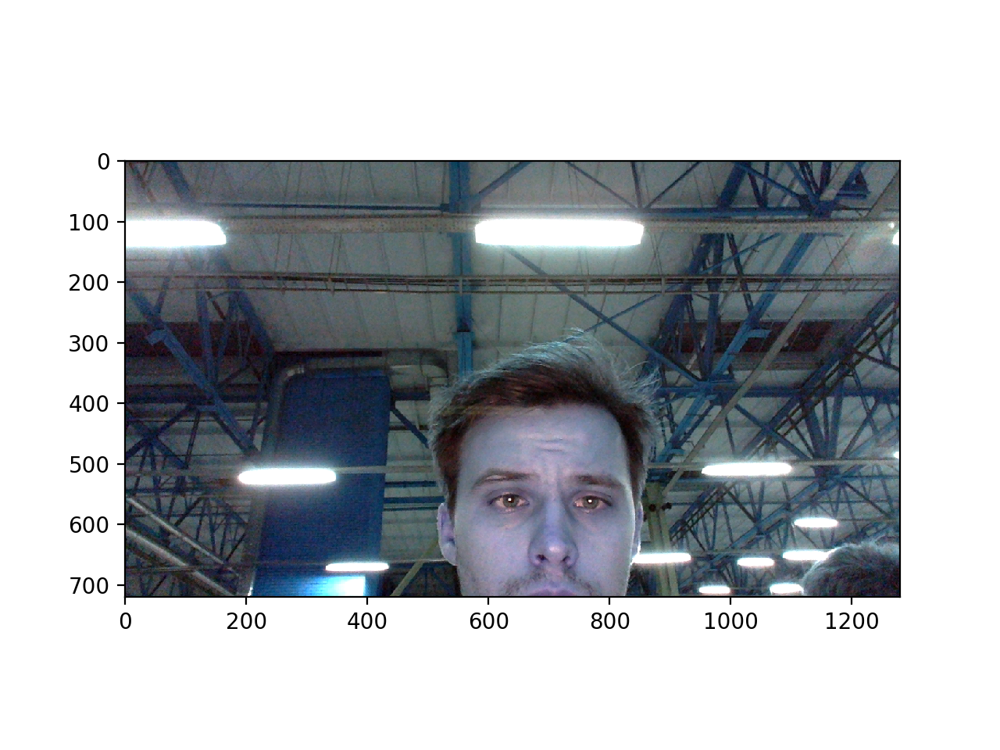

<IPython.core.display.Javascript object>


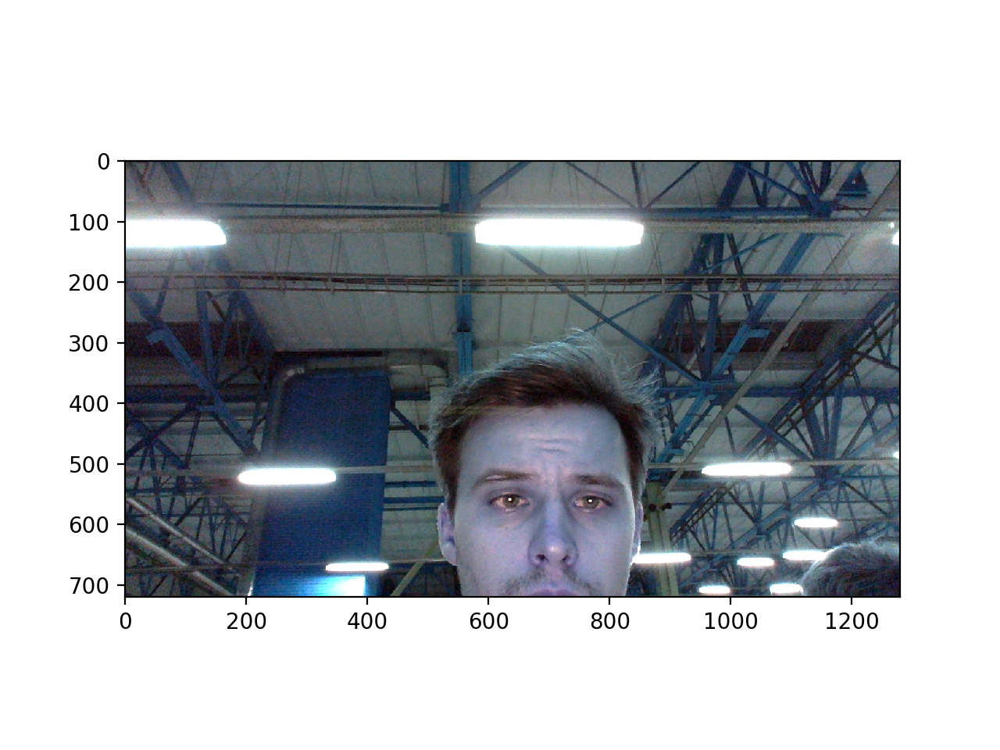

<IPython.core.display.Javascript object>


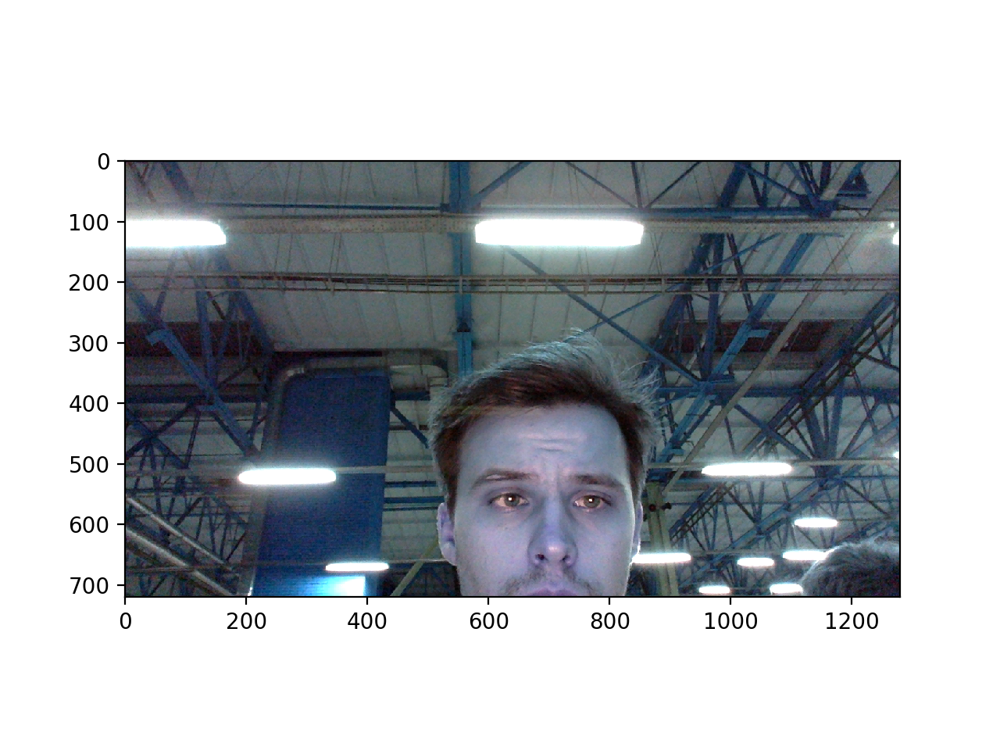

<IPython.core.display.Javascript object>


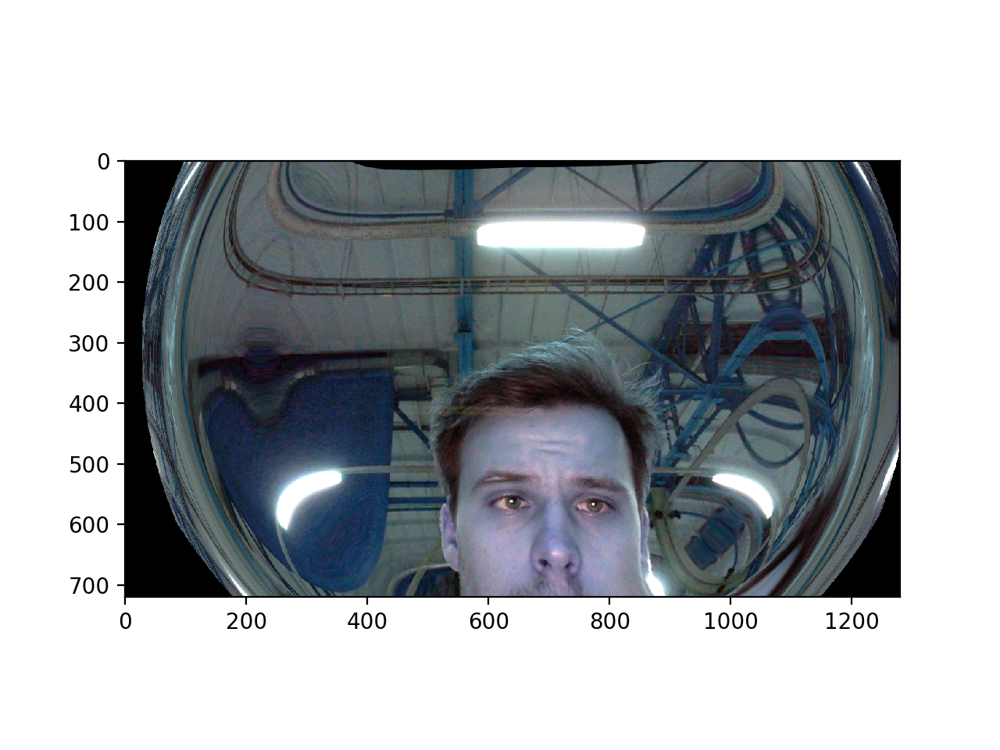

In [51]:
cap = cv2.VideoCapture(1)
for i in range(10):
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    corners, ids, rejectedImgPoints = aruco.detectMarkers(gray, aruco_dict, parameters=parameters)
    aruc3d = frame.copy()
    if len(corners) > 0:
        rvec, tvec, _ = aruco.estimatePoseSingleMarkers(corners, 0.33, camera_matrix, dist_coef)

        # Draw it
        for rvecs, tvecs in zip(rvec, tvec):
            aruco.drawAxis(aruc3d, camera_matrix, dist_coef, rvecs, tvecs, 0.33)
    
    plt.figure()
    plt.imshow(frame)
    plt.sle
    plt.show()
cap.release()
cv2.destroyAllWindows()

In [246]:
def find_markers(gray, camera_matrix, dist_coef, marker_size = 0.33):
    # input is a GRAY FRAME
    corners, ids, rejectedImgPoints = aruco.detectMarkers(gray, aruco_dict, parameters=parameters)
    
    rvecs, tvecs = [], []
    if len(corners) > 0:
        rvecs, tvecs, _ = aruco.estimatePoseSingleMarkers(corners, marker_size, camera_matrix, dist_coef)
        
    return corners, ids, rvecs, tvecs

In [49]:
cv2.destroyAllWindows()
cap.release()

In [45]:
cap = cv2.VideoCapture(0)

while(True):
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Our operations on the frame come here
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Display the resulting frame
    cv2.imshow('frame',gray)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

In [125]:
img = cv2.imread("calibration_data/logitech_webcam/2.jpg")
img_big = cv2.resize(img, (1280, 720))
img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Calibrate logitech webcam

In [211]:
img = cv2.imread("calibration_data/logitech_webcam/2.jpg")

In [210]:
camera_matrix_logitech = np.array([[ 8.3128578117340749e+02, 0., 4.7758512628154159e+02],
                          [0.,  6.8557482566742544e+02, 4.8549218718786739e+02],
                          [0., 0., 1. ]])

dist_coef_logitech = np.array([[ 5.5621857798127769e-02, -1.5908184683388261e-02,
       -1.9730203296953019e-02, 3.2824546979415056e-03,
       -3.6924852319778995e-01 ]])

<IPython.core.display.Javascript object>


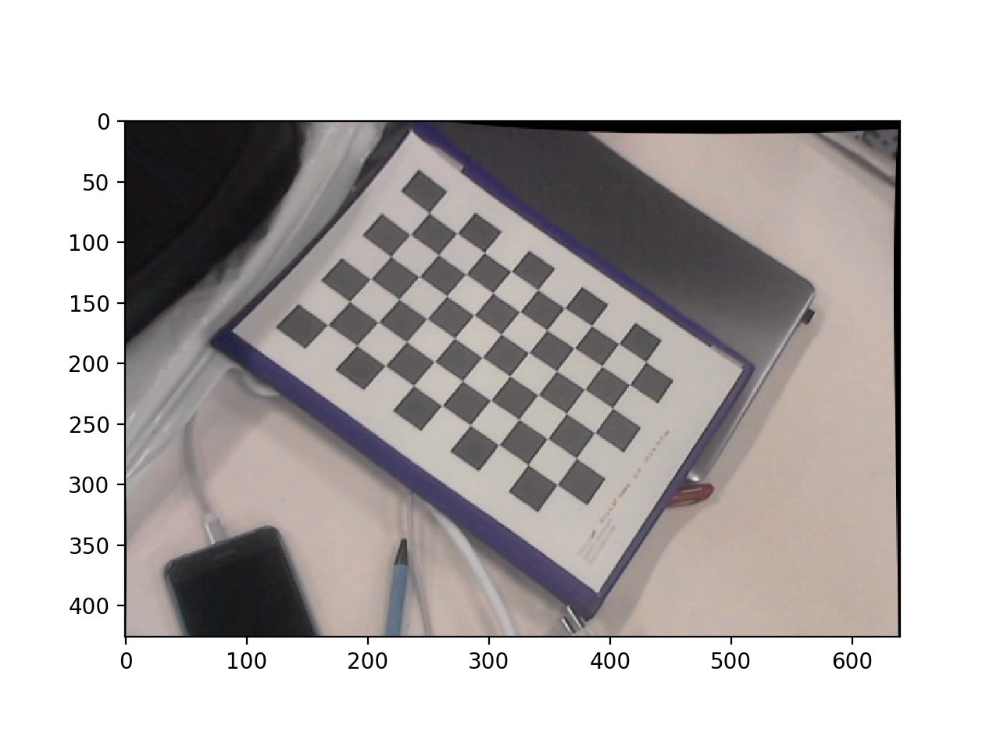

In [220]:
plt.figure()
plt.imshow(cv2.undistort(img, camera_matrix_logitech, dist_coef_logitech))
plt.show()

In [221]:
# looks like this time without deep shit

In [241]:
def read_camera_profile(path):
    cv_file = cv2.FileStorage(path, cv2.FILE_STORAGE_READ)
    camera_matrix = cv_file.getNode("camera_matrix").mat()
    dist_coef = cv_file.getNode("dist_coeff").mat()
    return camera_matrix, dist_coef

In [242]:
read_camera_profile("calibration_data/test.yaml")

(array([[831.28578117,   0.        , 477.58512628],
        [  0.        , 685.57482567, 485.49218719],
        [  0.        ,   0.        ,   1.        ]]),
 array([[ 0.05562186, -0.01590818, -0.0197302 ,  0.00328245, -0.36924852]]))